In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width: 100% !important; }</style>"))
pd.set_option("display.max_columns", 45)

In [15]:
df = pd.read_csv('./Data/statiz_origin_wr_wr.csv', encoding='euc-kr')

In [16]:
df['팀'][df['팀'] == 'k'] = 'kt'

In [17]:
df['팀'].unique()

array(['N', '롯', '넥', '삼', '두', 'S', '키', '한', 'K', 'L', 'kt', 'L넥', '넥N',
       'SL', 'NK', 'LS', '한K', 'KS', 'KK', '한두'], dtype=object)

### 운 지표 추가
사람이 하는 스포츠인 야구는 운의 요소가 많이 작용한다. 결과 예측의 정확도를 높이기 위해 운의 요소를 고려할 필요가 있으며, 이는 각 지표들이 전년도와 예측하려는 년도 사이에 어느 정도의 상관관계가 있는지 알아봐야 한다. 
상관 계수를 구해본 결과 홈런, 볼넷, 삼진아웃은 상관 계수가 높으며 직전 연도의 데이터와 관련성이 높은 것으로 나타났다. 반대로 2루타, 3루타는 상관 계수가 낮으며 직전 연도의 데이터와 관련성이 낮은 것으로 나타났다
즉 운의 요소를 많이 포함하고 있다고 볼 수 있다. 이러한 운의 요소를 수치화할 수 있는 지표를 추가한다.

In [19]:
df['twoBLUCK'] = df['2타']/(df['타수'] - df['홈런'] - df['삼진'])

In [20]:
df['threeBLUCK'] = df['3타']/(df['타수'] - df['홈런'] - df['삼진'])

In [21]:
df.rename(columns={"wRC+":"wRC"}, inplace = True)
df.rename(columns={"WAR+":"WAR"}, inplace = True)

In [96]:
df['이름'] == '김주형'

0      False
1      False
2      False
3      False
4      False
       ...  
741     True
742    False
743    False
744    False
745    False
Name: 이름, Length: 746, dtype: bool

In [97]:
df['count'] = None
for x in set(df['이름']):
    df['count'][df['이름'] == x] = df[df['이름'] == x]['ID'].count()

In [99]:
df['count'].unique()

array([2, 3, 5, 6, 4, 1], dtype=object)

In [111]:
# 변수 선택?
model = sm.OLS.from_formula(
    "OPS ~ ID + 팀 + 시즌 + 포지션 + 나이 + G + 타석 + 득점 + 안타 + 루타 + 타점 + 도루 + 도실 + 볼넷 + 사구 + 고4 + 병살 + 희타 + 희비 + 타율 + 출루+ 장타 + wOBA + wRC + WAR + twoBLUCK + threeBLUCK + 나이1 + count", data=df)
result= model.fit()
sm.stats.anova_lm(result, typ=2)

,sum_sq,df,F,PR(>F)
팀,2.711155e-06,19.0,7.662018e-01,0.748643
포지션,1.255130e-06,9.0,7.488391e-01,0.664081
count,6.647146e-07,5.0,7.138511e-01,0.613165
ID,5.794153e-07,1.0,3.111232e+00,0.078213
시즌,1.380207e-06,1.0,7.411168e+00,0.006652
나이,1.050199e-07,1.0,5.639153e-01,0.452953
G,1.962641e-08,1.0,1.053861e-01,0.745561
타석,4.300972e-08,1.0,2.309453e-01,0.630982
득점,2.432013e-07,1.0,1.305895e+00,0.253550
안타,1.926870e-07,1.0,1.034653e+00,0.309438


In [110]:
sns.pairplot(df[['OPS','팀', 'wOBA','wRC','WAR','twoBLUCK','threeBLUCK','나이', '타점', '도루', '도실', '사구', '희타', '출루', 'count']])
plt.show()

In [107]:
X = df[['시즌','나이', '타점','도루','도실', '사구', '희타','타율','출루','threeBLUCK']]
dfy = df[['OPS']]
dfX = sm.add_constant(X)

In [107]:
# 4이상 : 팀, 포지션, 시즌, 나이, 타점, 도루, 도실, 사구, 희타, 출루, threeBLUCK
model = sm.OLS.from_formula('OPS~ 포지션 + C(시즌) + 나이 + 타점 + 도루 + 도실 + 사구 + 희타 + 출루 + threeBLUCK + count', data=df)
result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                    OPS   R-squared:                       0.939
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     344.4
Date:                Sun, 29 Mar 2020   Prob (F-statistic):               0.00
Time:                        21:14:03   Log-Likelihood:                 808.91
No. Observations:                 725   AIC:                            -1554.
Df Residuals:                     693   BIC:                            -1407.
Df Model:                          31                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         0.1006      0.029      3.516

### 나이
그래서 20세부터 35세까지 10년 이상 뛴 선수로 대상을 좁혀 나이별 성적을 파악해보았다. 타자의 경우는 전체 선수를 대상으로 했을 때와 마찬가지로 27세 때의 기록이 가장 좋아 비슷한 결과를 보였다. 그러나 앞선 전체 기록과 비교하면 전성기 전후로 상하향 곡선이 일정하다. OPS를 기준으로 보면 22세부터 31세까지 차이가 크지 않다가 32세부터 급하락한다. 이런 경향은 장타율이 가장 심하며 출루율은 그나마 편차가 크지 않다. 나이가 들수록 힘이 떨어져 장타력은 떨어지지만 선구안이 좋아졌다고 봐도 무방할 듯하다.
https://news.joins.com/article/3884660

In [27]:
df['나이'].unique()

array([30, 29, 26, 28, 34, 25, 27, 31, 33, 35, 32, 36, 37, 23, 38, 24, 39,
       40, 22, 41, 21, 42, 20, 19, 43])

In [74]:
#esult['나이'] = result.apply(lambda x: x['시즌'] - int(x['생일'][:4]) + 1, axis=1)
df['나이1'] = df.apply(lambda x : 1 if x['나이'] >= 32 else 0, axis=1)

나이
19    0.6880
20    0.5000
21    0.0000
22    0.5320
23    0.5950
24    0.5000
25    0.6000
26    0.5860
27    0.6185
28    0.6930
29    0.7300
30    0.6830
31    0.7155
32    0.7230
33    0.6850
34    0.7820
35    0.7165
36    0.6870
37    0.7070
38    0.7670
39    0.6945
40    0.7500
41    0.6660
42    0.7240
43    1.1380
Name: OPS, dtype: float64

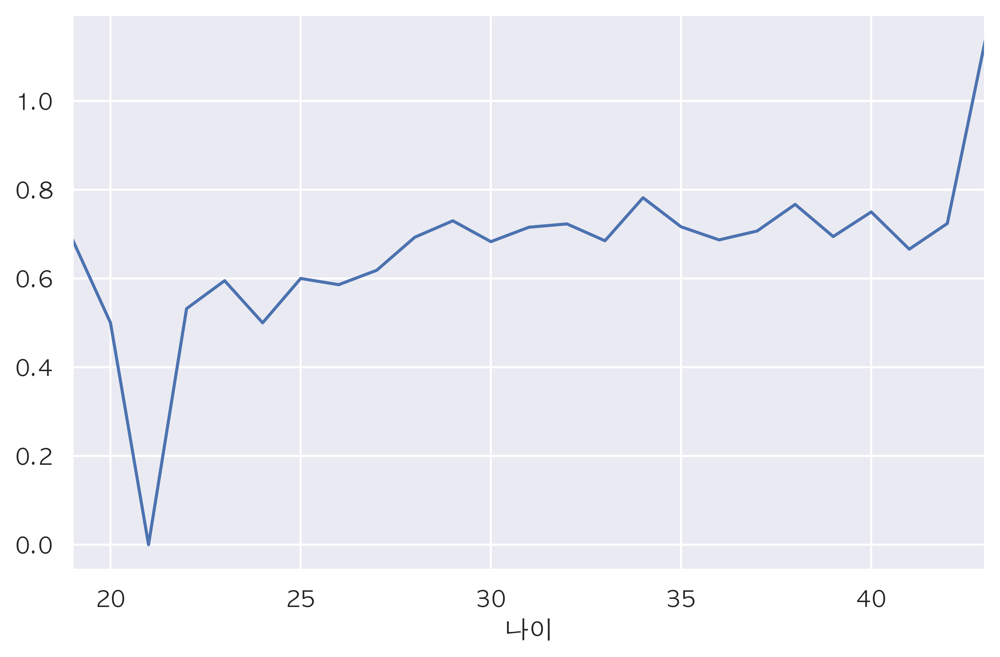

In [83]:
grouped= df['OPS'].groupby(df['나이'])
grouped.median().plot()

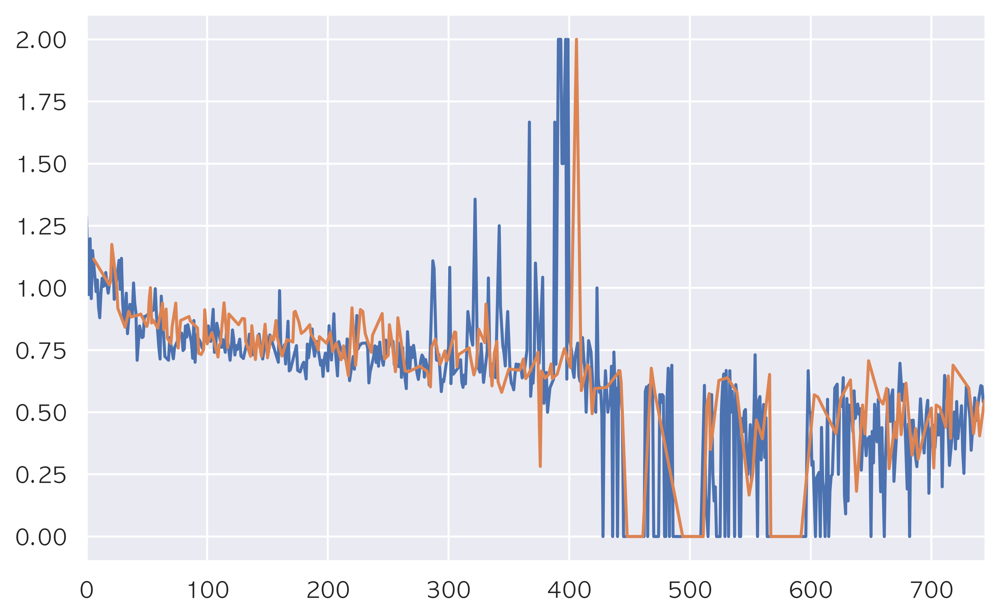

In [75]:
df1 = df[df['나이1'] == 0]['OPS']
df1.plot()
df2 = df[df['나이1'] == 1]['OPS']
df2.plot()

In [45]:
model = sm.OLS.from_formula('OPS~ 포지션 + 시즌 + C(나이1) + 타점 + 도루 + 도실 + 사구 + 희타 + 출루 + threeBLUCK + 0', data=df)
result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                    OPS   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     588.5
Date:                Sun, 29 Mar 2020   Prob (F-statistic):               0.00
Time:                        20:34:13   Log-Likelihood:                 799.98
No. Observations:                 725   AIC:                            -1562.
Df Residuals:                     706   BIC:                            -1475.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
포지션[#REF!]     -2.4873      2.201     -1.130      

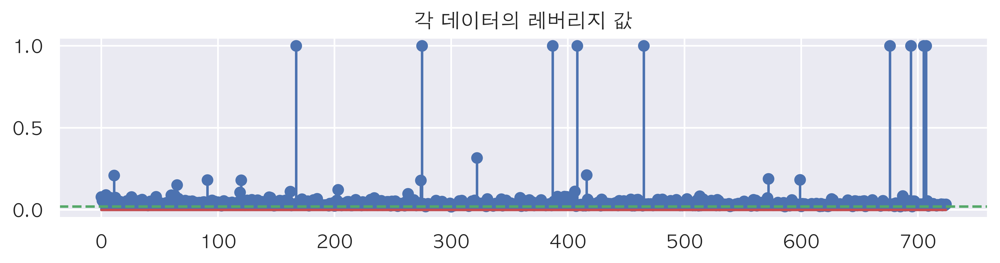

In [60]:
# 영향도 정보 객체
influence = result.get_influence()
hat = influence.hat_matrix_diag

plt.figure(figsize=(10, 2))
plt.stem(hat)
plt.axhline(0.02, c='g', ls='--')
plt.title('각 데이터의 레버리지 값')
plt.show()

In [61]:
hat.sum()

37.99999999999995

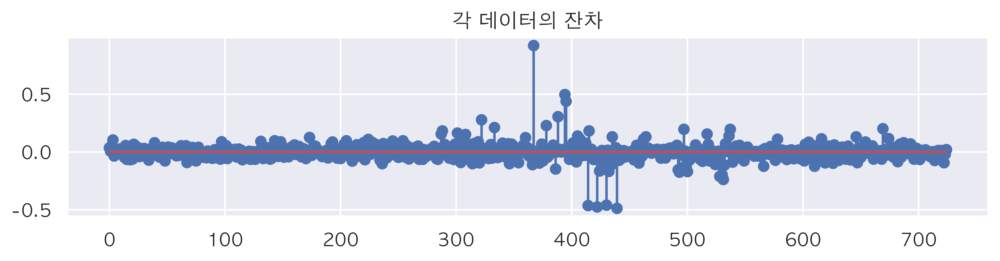

In [62]:
# 표준화 잔차 계산
plt.figure(figsize=(10, 2))
plt.stem(result.resid)
plt.title('각 데이터의 잔차')
plt.show()

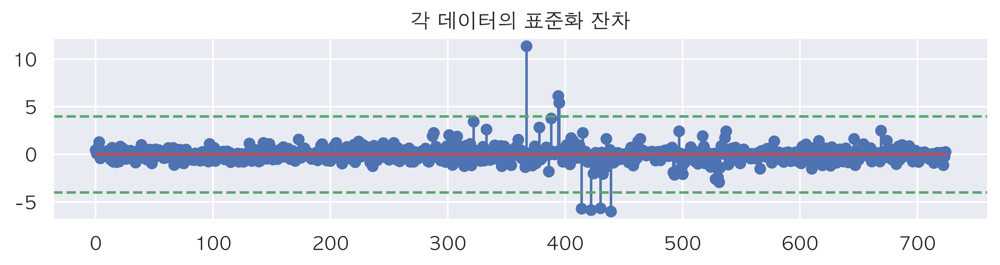

In [29]:
plt.figure(figsize=(10, 2))
plt.stem(result.resid_pearson)
plt.axhline(4, c='g', ls='--')
plt.axhline(-4, c='g', ls='--')
plt.title('각 데이터의 표준화 잔차')
plt.show()

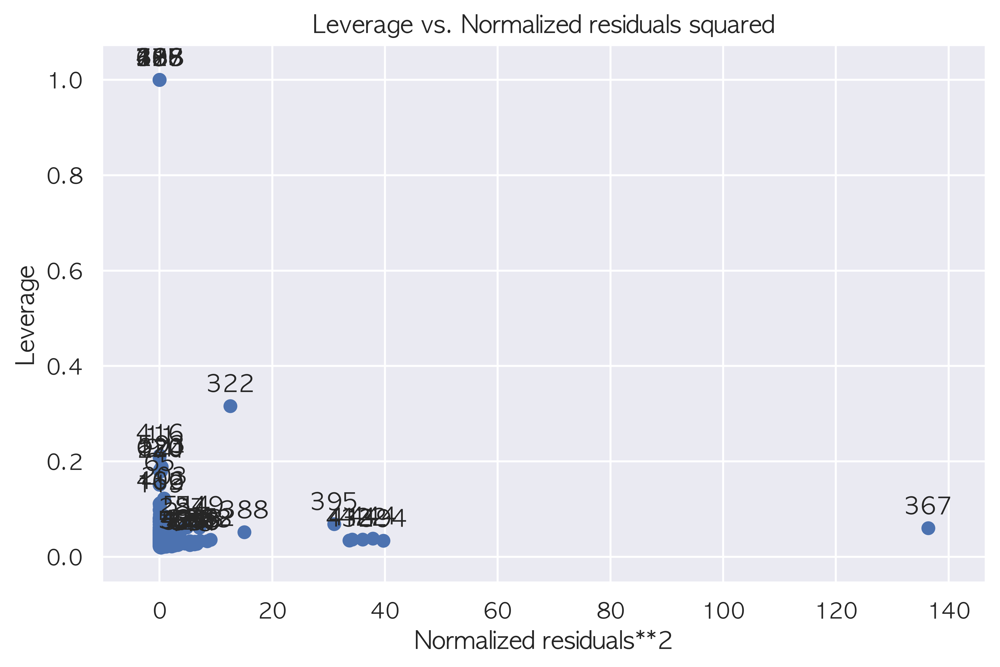

In [30]:
sm.graphics.plot_leveragfe

In [118]:
# 아웃라이어 제거
idx = np.where(cooks_d2 > fox_cr)[0]
idx2 = list(set(range(len(df))).difference(idx))
df1 = df.iloc[idx2, :].reset_index(drop=True)

In [121]:
model = sm.OLS.from_formula('OPS~  팀 + 포지션 + 시즌 + 나이 + 타점 + 도루 + 도실 + 사구 + 희타 + 출루 + threeBLUCK', data=df1)
result1 = model.fit()
print(result1.summary())

                            OLS Regression Results                            
Dep. Variable:                    OPS   R-squared:                       0.967
Model:                            OLS   Adj. R-squared:                  0.965
Method:                 Least Squares   F-statistic:                     571.5
Date:                Sun, 29 Mar 2020   Prob (F-statistic):               0.00
Time:                        19:53:27   Log-Likelihood:                 1019.4
No. Observations:                 706   AIC:                            -1969.
Df Residuals:                     671   BIC:                            -1809.
Df Model:                          34                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -2.0115      1.672     -1.203      0.2

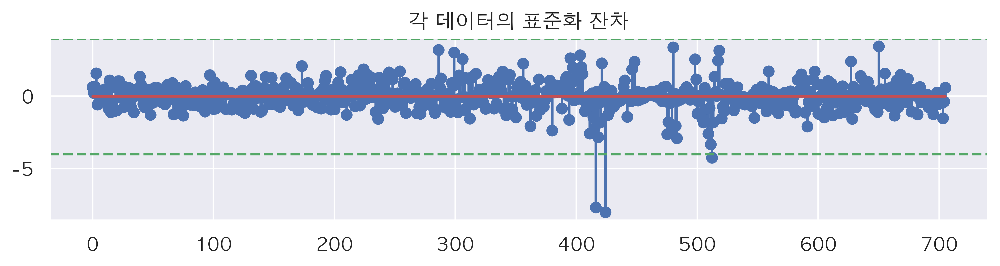

In [122]:
plt.figure(figsize=(10, 2))
plt.stem(result1.resid_pearson)
plt.axhline(4, c='g', ls='--')
plt.axhline(-4, c='g', ls='--')
plt.title('각 데이터의 표준화 잔차')
plt.show()

In [26]:
df['나이'].unique()

array([30, 29, 26, 28, 34, 25, 27, 31, 33, 35, 32, 36, 37, 23, 38, 24, 39,
       40, 22, 41, 21, 42, 20, 19, 43])

In [6]:
import re
regular_season_Batter['univ'] = None
regular_season_Batter['transfer'] = None
for x in regular_season_Batter['career']:
    if re.findall('[가-힣]+초-[가-힣]+중-[가-힣]+고-[가-힣]+대', x):
        regular_season_Batter['univ'][regular_season_Batter['career']==x] = 1 
        regular_season_Batter['transfer'][regular_season_Batter['career']==x] = len(x.split('-')) -4
    else:
        regular_season_Batter['univ'][regular_season_Batter['career']==x] = 0
        regular_season_Batter['transfer'][regular_season_Batter['career']==x] = len(x.split('-')) -3

In [7]:
regular_season_Batter.transfer.unique() # -2, -1은 외국인

array([-2, 0, 2, 3, 5, 1, -1, 4, 6], dtype=object)

In [8]:
for x in regular_season_Batter[regular_season_Batter['transfer'] == -2]['career']:
    if re.findall('[a-z,A-Z,가-힣]\D+대', x):
        regular_season_Batter['univ'][regular_season_Batter['career']==x] = 1 
    else:
        regular_season_Batter['univ'][regular_season_Batter['career']==x] = 0

In [9]:
regular_season_Batter['transfer'][regular_season_Batter['transfer'] == -1] = 0

In [10]:
#regular_season_Batter = regular_season_Batter.dropna(thresh=int(len(regular_season_Batter) * 0.5), axis=1)

In [11]:
#2B_LUCK = 2B/(AB - HR - SO)
regular_season_Batter['towB_LUCK'] = regular_season_Batter['2B']/(regular_season_Batter['AB'] - regular_season_Batter['HR'] - regular_season_Batter['SO'])

In [12]:
regular_season_Batter['threeB_LUCK'] = regular_season_Batter['3B']/(regular_season_Batter['AB'] - regular_season_Batter['HR'] - regular_season_Batter['SO'])

In [13]:
regular_season_Batter['age'] = regular_season_Batter.apply(lambda x: x['year'] - int(x['year_born'][:4]) + 1, axis=1)

In [14]:
model = sm.OLS.from_formula('OPS ~ RBI + CS + GDP + towB_LUCK + threeB_LUCK', data=regular_season_Batter)
result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                    OPS   R-squared:                       0.490
Model:                            OLS   Adj. R-squared:                  0.489
Method:                 Least Squares   F-statistic:                     461.0
Date:                Sat, 28 Mar 2020   Prob (F-statistic):               0.00
Time:                        17:05:40   Log-Likelihood:                 689.39
No. Observations:                2401   AIC:                            -1367.
Df Residuals:                    2395   BIC:                            -1332.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.4288      0.007     64.833      

In [19]:
regular_season_Batter

,batter_id,batter_name,year,team,avg,G,AB,R,H,2B,3B,HR,TB,RBI,SB,CS,BB,HBP,SO,GDP,SLG,OBP,E,year_born,position,career,starting_salary,OPS,age,univ,transfer,towB_LUCK,threeB_LUCK
0,0,가르시아,2018,LG,0.339,50,183,27,62,9,0,8,95,34,5,0,9,8,25,3,0.519,0.383,9,1985년 04월 12일,내야수(우투우타),쿠바 Ciego de Avila Maximo Gomez Baez(대),19300만원,0.902,34,1,-2,0.060000,0.000000
1,1,강경학,2011,한화,0.000,2,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0.000,0.000,1,1992년 08월 11일,내야수(우투좌타),광주대성초-광주동성중-광주동성고,10000만원,0.000,20,0,0,NaN,NaN
2,1,강경학,2014,한화,0.221,41,86,11,19,2,3,1,30,7,0,0,13,2,28,1,0.349,0.337,6,1992년 08월 11일,내야수(우투좌타),광주대성초-광주동성중-광주동성고,10000만원,0.686,23,0,0,0.035088,0.052632
3,1,강경학,2015,한화,0.257,120,311,50,80,7,4,2,101,27,4,3,40,5,58,3,0.325,0.348,15,1992년 08월 11일,내야수(우투좌타),광주대성초-광주동성중-광주동성고,10000만원,0.673,24,0,0,0.027888,0.015936
4,1,강경학,2016,한화,0.158,46,101,16,16,3,2,1,26,7,0,0,8,2,30,5,0.257,0.232,7,1992년 08월 11일,내야수(우투좌타),광주대성초-광주동성중-광주동성고,10000만원,0.489,25,0,0,0.042857,0.028571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2449,344,황진수,2014,롯데,0.000,5,5,0,0,0,0,0,0,0,0,0,0,0,1,0,0.000,0.000,0,1989년 02월 15일,내야수(우투양타),석천초-대헌중-공주고,4000만원,0.000,26,0,0,0.000000,0.000000
2450,344,황진수,2015,롯데,0.000,2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0,1989년 02월 15일,내야수(우투양타),석천초-대헌중-공주고,4000만원,0.000,27,0,0,0.000000,0.000000
2451,344,황진수,2016,롯데,0.000,11,10,2,0,0,0,0,0,0,0,1,0,0,5,0,0.000,0.000,0,1989년 02월 15일,내야수(우투양타),석천초-대헌중-공주고,4000만원,0.000,28,0,0,0.000000,0.000000
2452,344,황진수,2017,롯데,0.291,60,117,18,34,6,2,1,47,16,4,0,10,3,38,2,0.402,0.359,4,1989년 02월 15일,내야수(우투양타),석천초-대헌중-공주고,4000만원,0.761,29,0,0,0.076923,0.025641
